In [1]:
#To be cleaned
# Import badlands grid generation toolbox
import pybadlands_companion.hydroGrid as hydr

# display plots in SVG format
%config InlineBackend.figure_format = 'svg' 

In [2]:
#To be cleaned

import plotly
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
import xml.etree.ElementTree as ETO
from scipy.interpolate import RectBivariateSpline
from plotly.graph_objs import *
plotly.offline.init_notebook_mode()
import matplotlib.ticker as ticker
import matplotlib.cm as cm
import matplotlib as mpl
%matplotlib inline

from matplotlib import cm
import pandas as pd
import glob
import numpy as np

import re

In [3]:
import os

def pywalker(path):
#this function get the folder's name containing 'h5' as a list
    folders=[]
    for root, dirs, files in os.walk(path):
        for dir_ in dirs:
            if dir_=='h5':
                folder=os.path.join(root, dir_)
                folders.append(folder)
    return folders     

In [4]:
#The user has to give the coordinates for the main stream, what if the mouth bar is located in different coordinates
def plot_distvsZ(path):
    """save hydro.streamZ and  hydro.streamLght,  plot (hydro.streamZ, hydro.streamLght)"""
    folders=pywalker(path)

    for folder in folders:
        csvname=re.search(r"./(.*)/h5",folder)
        csv=csvname.group(1)#give the label for the legend
        #give the label for plotting lines
        result=re.search(r"__(.*)/h5",folder)
        label=result.group(1)#give the label for the legend
        
        tin_file = filter(lambda fname: 'tin.time' in fname, os.listdir(folder))
        nfile=len(tin_file)

        bwdist_Z = pd.DataFrame()
        
        num_plots = nfile-1
        colormap = plt.cm.gist_ncar
        plt.gca().set_color_cycle([colormap(i) for i in np.linspace(0, 0.9, num_plots)])
        labels = []
        
        for step in range(1,nfile,1):
            hydro = hydr.hydroGrid(folder, ncpus=1, \
                                  ptXY = [1.88381e+6,1.01018e+6])
            hydro.getCatchment(timestep=step)#Pre-defined function to extract the catchment
            hydro.extractMainstream()#Pre-defined function to extract the main stream of that catchment
            hydro.computeParams(kd=0.0001, kc=5.e-6, m=0.5, n=1., num=500)#  Computes the cumulative main stream lenght
       
            inverse_distance = np.zeros(len(hydro.streamLght))#Empty list to store the stream length "backwards"

            for j in range(len(hydro.streamLght)): 
                inverse_distance[j]=hydro.streamLght.max()-hydro.streamLght[j]#calculate basinward distance by 

            col={}
            streamLght=[]
            hydrovalue=[]

            col['hydro.streamZ_ts'+str(step)]=hydrovalue #elevation
            col['hydro.streamLght_ts'+str(step)]=streamLght
            for i in range(len(hydro.streamZ)):
                streamLght.append(hydro.streamLght[i])
                hydrovalue.append(hydro.streamZ[i])
            df=pd.DataFrame(data=col)

            bwdist_Z=pd.concat([bwdist_Z,df], ignore_index=False, axis=1)
            #plot figure
            plt.plot(streamLght, hydrovalue)
#             label=step
            labels.append(step)

        plt.legend(labels, ncol=8, loc='upper left', bbox_to_anchor=(0,-0.2),
               columnspacing=1.0, labelspacing=0.0,
               handletextpad=0.0, handlelength=1.5,
               fancybox=True, shadow=None)
        plt.xlabel('hydro.streamLght')
        plt.ylabel('hydro.streamZ')
        plt.savefig("./Main_river_elevsdistance_time_"+str(label)+".pdf")
        plt.show()
        bwdist_Z.to_csv(path+csv+'_distvsZ.csv', sep=',', encoding='utf-8')        

/usr/local/lib/python2.7/dist-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning:

The set_color_cycle attribute was deprecated in version 1.5. Use set_prop_cycle instead.



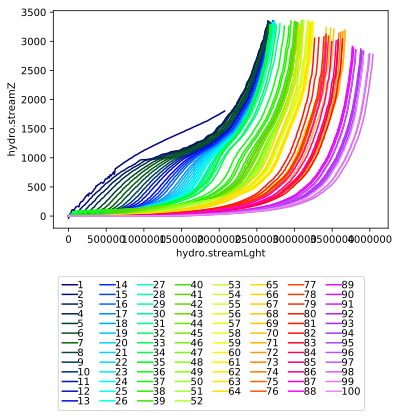

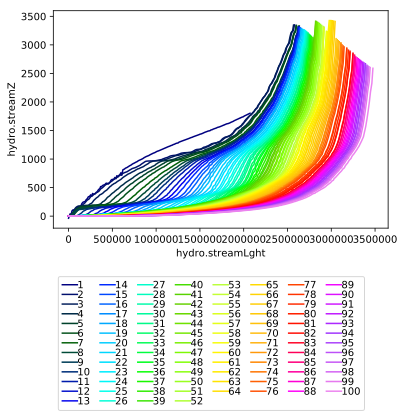

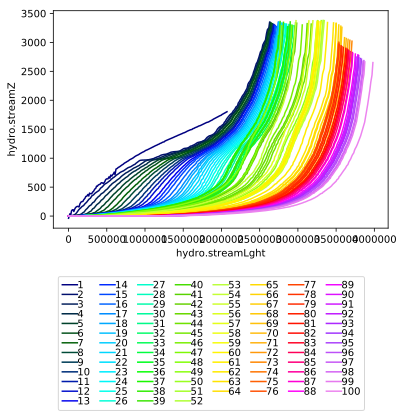

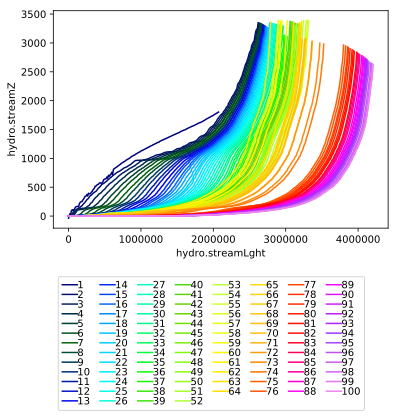

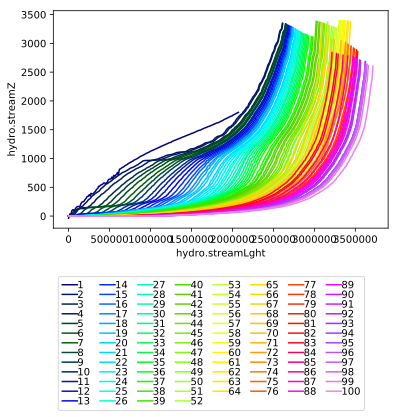

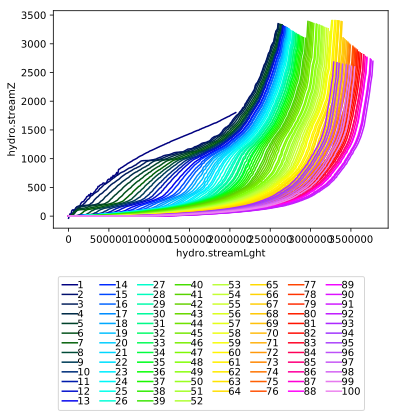

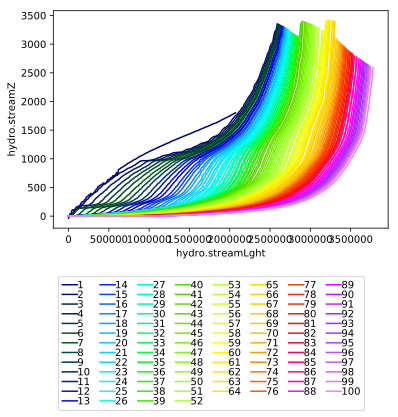

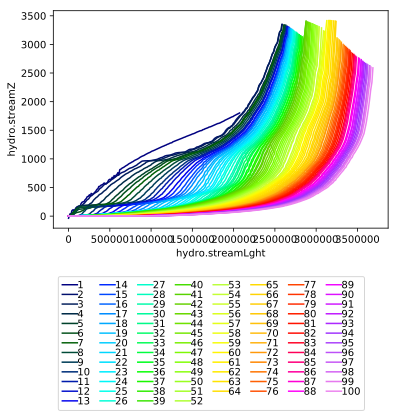

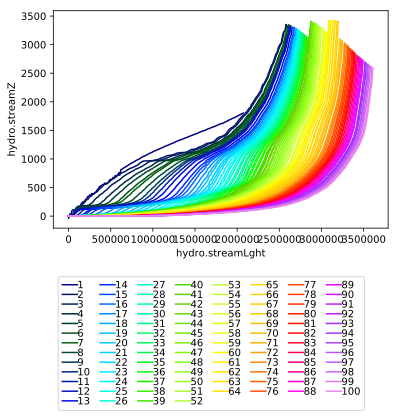

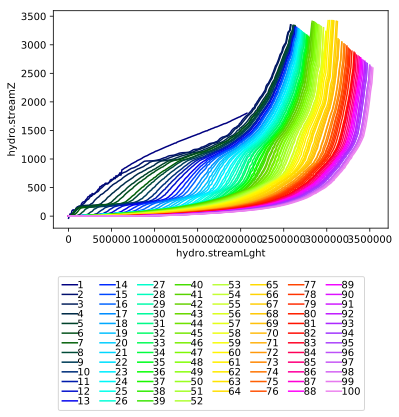

In [5]:
plot_distvsZ('./')

In [ ]:
pwd